In [35]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
from matplotlib.ticker import FormatStrFormatter
import matplotlib.gridspec as gridspec


from gwbird import detectors
from gwbird import pls
from gwbird import overlap 
from gwbird import nell 
from gwbird import skymap

from gwbird.skymap import Skymaps
from gwbird.overlap import Response
from gwbird.nell import AngularResponse, Sensitivity_ell

%config InlineBackend.figure_format = 'retina'

from astropy.cosmology import Planck15
cosmo = Planck15
H0 =  cosmo.H0.to('1/s').value

c = 299792458 #m/s

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['lines.linewidth'] = 3
plt.rcParams['font.family'] = 'serif'



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


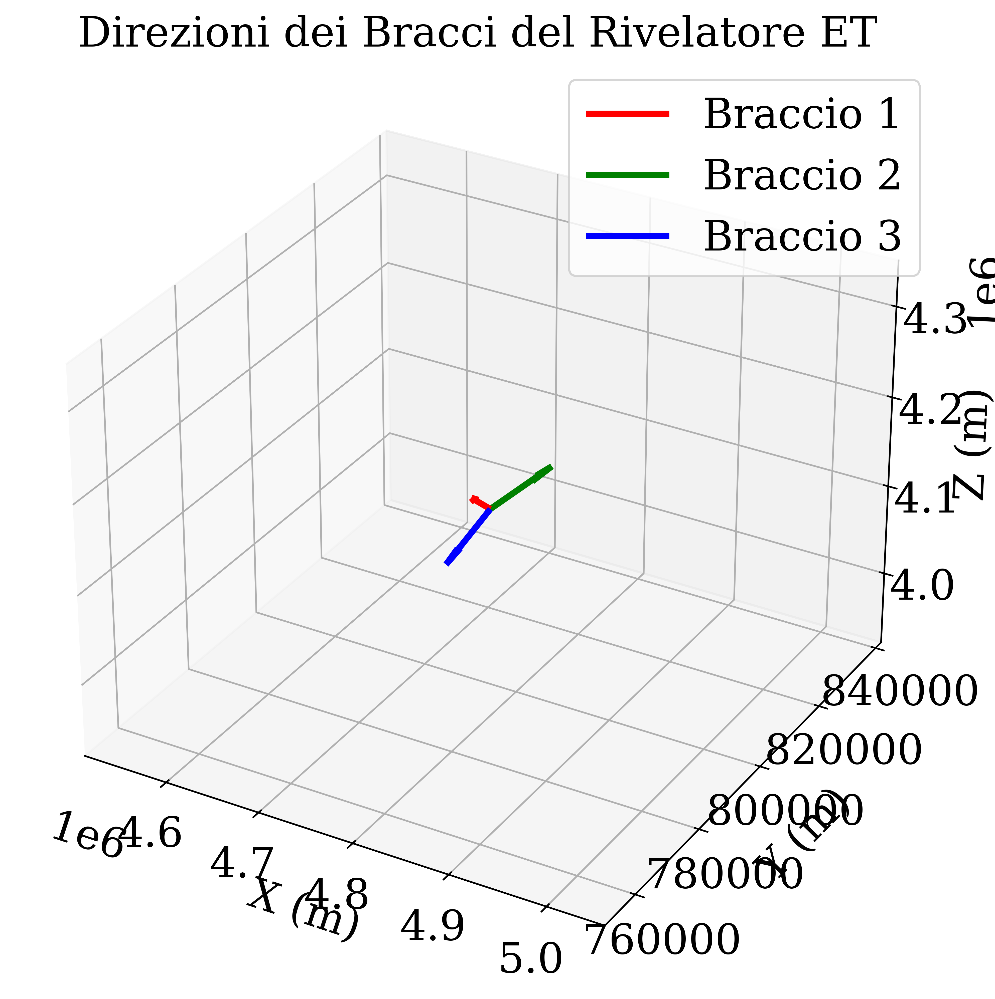

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Dati
REarth = 6.371e6  # Raggio della Terra in metri
c = np.array([0.751, 0.125, 0.649]) * REarth  # Centro globale

# Direzioni dei bracci (non normalizzate)
arm1 = np.array([-0.640, -0.106, 0.761])
arm2 = np.array([0.178,  0.908, -0.381])
arm3 = np.array([0.462, -0.801, -0.381])

# Normalizzazione dei vettori
u1 = arm1 / np.linalg.norm(arm1)
u2 = arm2 / np.linalg.norm(arm2)
u3 = arm3 / np.linalg.norm(arm3)

# Lunghezza delle frecce per la visualizzazione
arrow_length = 2e4  # 20 km

# Creazione del plot 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot delle direzioni dei bracci
ax.quiver(c[0], c[1], c[2], u1[0], u1[1], u1[2], length=arrow_length, color='r', label='Braccio 1')
ax.quiver(c[0], c[1], c[2], u2[0], u2[1], u2[2], length=arrow_length, color='g', label='Braccio 2')
ax.quiver(c[0], c[1], c[2], u3[0], u3[1], u3[2], length=arrow_length, color='b', label='Braccio 3')

# Etichette e titolo
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Direzioni dei Bracci del Rivelatore ET')
ax.legend()

# Visualizzazione
plt.show()


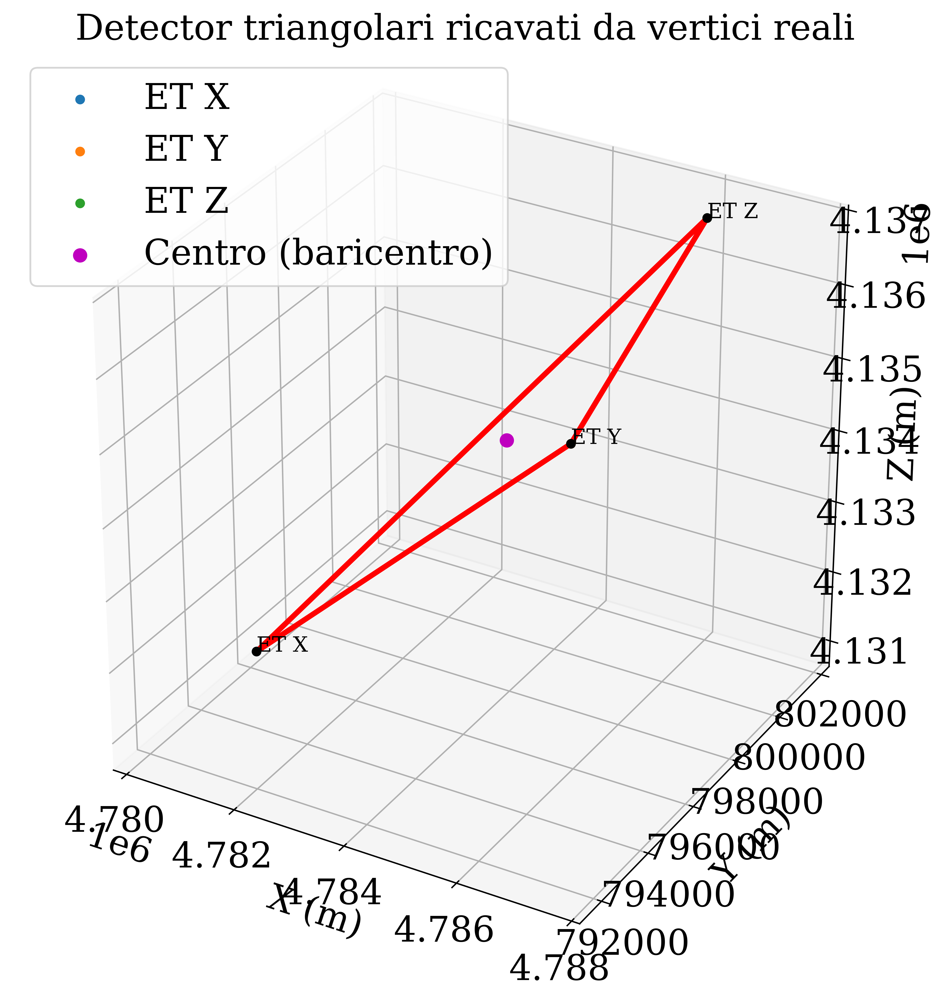

In [37]:
import numpy as np
import matplotlib.pyplot as plt

REarth = 6371e3
c = np.array([0.751, 0.125, 0.649]) * REarth  # baricentro globale
dir_triangle = np.array([-0.640, -0.106, 0.761])  # normale al piano del triangolo

L = 1e4  # lunghezza bracci (10 km)
colors = ['r', 'g', 'b']
names = ["ET X", "ET Y", "ET Z"]

# Triangolo equilatero nel piano XY (baricentro all'origine)
def local_equilateral_triangle(L):
    h = np.sqrt(3)/3 * L  # distanza dal baricentro a ogni vertice
    A = np.array([0, -h, 0])
    B = np.array([+0.5 * L, h / 2, 0])
    C = np.array([-0.5 * L, h / 2, 0])
    return A, B, C

# Rotazione per portare triangolo nel piano ortogonale a dir_triangle
def rotation_matrix_from_z(dir_vec):
    z = dir_vec / np.linalg.norm(dir_vec)
    up = np.array([0, 0, 1]) if abs(z[2]) < 0.99 else np.array([0, 1, 0])
    x = np.cross(up, z)
    x /= np.linalg.norm(x)
    y = np.cross(z, x)
    return np.stack([x, y, z], axis=1)

# 1. Costruiamo i vertici globali del triangolo
A_loc, B_loc, C_loc = local_equilateral_triangle(L)
R = rotation_matrix_from_z(dir_triangle)
A = R @ A_loc + c
B = R @ B_loc + c
C = R @ C_loc + c

# 2. Costruiamo i detector
detectors = [
    (A, B - A, C - A, "ET X"),
    (B, C - B, A - B, "ET Y"),
    (C, A - C, B - C, "ET Z"),
]

# 3. Plot dei bracci dei 3 detector
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for origin, arm1, arm2, name in detectors:
    ax.plot(*zip(origin, origin + arm1), color='r')
    ax.plot(*zip(origin, origin + arm2), color='r')
    ax.scatter(*origin, label=name)
    ax.text(*origin, name, fontsize=12)

# Plot dei vertici e del baricentro
ax.scatter(*A, color='k')
ax.scatter(*B, color='k')
ax.scatter(*C, color='k')
ax.scatter(*c, color='m', label="Centro (baricentro)", s=50)

ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
ax.set_zlabel("Z (m)")
ax.set_title("Detector triangolari ricavati da vertici reali")
ax.legend()
ax.set_box_aspect([1, 1, 1])
plt.tight_layout()
plt.show()


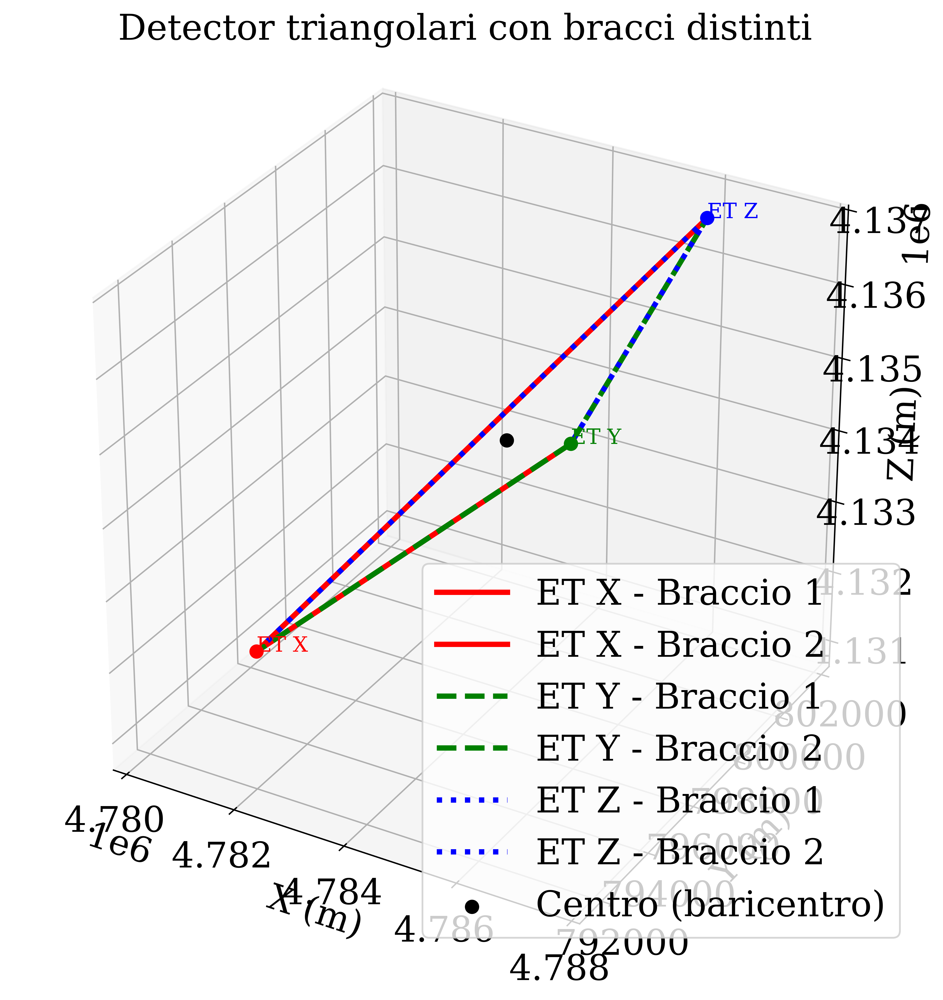

In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Costanti
REarth = 6371e3  # Raggio terrestre in metri
L = 1e4  # Lunghezza dei bracci: 10 km

# Centro del network
c = np.array([0.751, 0.125, 0.649]) * REarth

# Direzioni dei piani dei triangoli
dirs = [
    np.array([-0.640, -0.106, 0.761]),
    np.array([0.178,  0.908, -0.381]),
    np.array([0.462, -0.801, -0.381])
]

names = ["ET X", "ET Y", "ET Z"]
colors = ['r', 'g', 'b']
linestyles = ['solid', 'dashed', 'dotted']

# Funzione per creare un triangolo equilatero nel piano XY
def local_equilateral_triangle(L):
    h = np.sqrt(3)/3 * L  # Distanza dal baricentro a ogni vertice
    A = np.array([0, -h, 0])
    B = np.array([+0.5 * L, h / 2, 0])
    C = np.array([-0.5 * L, h / 2, 0])
    return A, B, C

# Funzione per creare una matrice di rotazione che ruota il piano XY nel piano ortogonale a dir_vec
def rotation_matrix_from_z(dir_vec):
    z = dir_vec / np.linalg.norm(dir_vec)
    up = np.array([0, 0, 1]) if abs(z[2]) < 0.99 else np.array([0, 1, 0])
    x = np.cross(up, z)
    x /= np.linalg.norm(x)
    y = np.cross(z, x)
    return np.stack([x, y, z], axis=1)

# Costruzione dei vertici globali del triangolo
A_loc, B_loc, C_loc = local_equilateral_triangle(L)
R = rotation_matrix_from_z(dirs[0])  # Utilizziamo la prima direzione per orientare il triangolo
A = R @ A_loc + c
B = R @ B_loc + c
C = R @ C_loc + c

# Costruzione dei detector
detectors = [
    (A, B - A, C - A, "ET X"),
    (B, C - B, A - B, "ET Y"),
    (C, A - C, B - C, "ET Z"),
]

# Plot dei bracci dei 3 detector
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for (origin, arm1, arm2, name), color, linestyle in zip(detectors, colors, linestyles):
    ax.plot(*zip(origin, origin + arm1), color=color, linestyle=linestyle, label=f"{name} - Braccio 1")
    ax.plot(*zip(origin, origin + arm2), color=color, linestyle=linestyle, label=f"{name} - Braccio 2")
    ax.scatter(*origin, color=color, s=50)
    ax.text(*origin, name, fontsize=12, color=color)

# Plot del centro del network
ax.scatter(*c, color='k', s=50, label='Centro (baricentro)')

# Impostazioni del grafico
ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
ax.set_zlabel("Z (m)")
ax.set_title("Detector triangolari con bracci distinti")
ax.legend()
ax.set_box_aspect([1, 1, 1])
plt.tight_layout()
plt.show()


# Example notebook for ET $\Delta$

* Response (Overlap Reduction function)

In [39]:
f = np.logspace(np.log10(1), np.log10(100000), 1000)

print('Calculating Overlaps ET triangular')
print('- tensor modes')
R_t = Response.overlap('ET Z', 'ET Y', f, 0, 't', None)
print('- vector modes')
R_v = Response.overlap('ET Z', 'ET Y', f, 0, 'v', None)
print('- scalar modes')
R_s = Response.overlap('ET Z', 'ET Y', f, 0, 's', None)
print('- V')
R_V = Response.overlap('ET Z', 'ET Y', f, 0, 'V', None)

Calculating Overlaps ET triangular
- tensor modes
- vector modes
- scalar modes
- V


Text(0.5, 1.0, 'ET $\\Delta$ response')

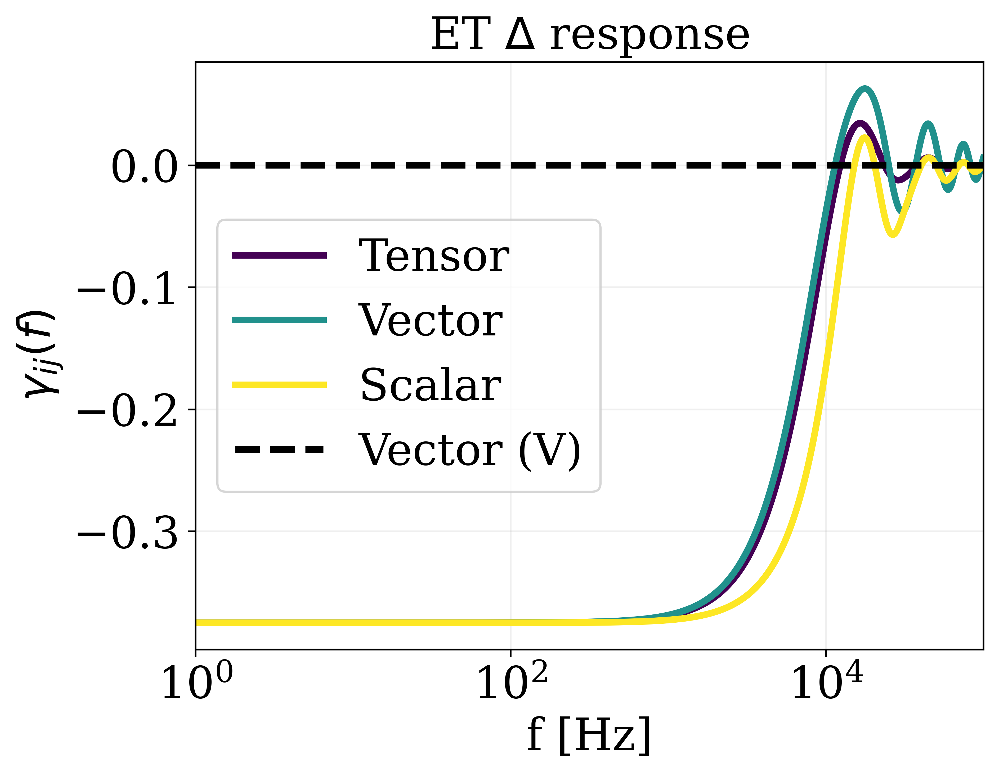

In [40]:
colors = cm.viridis(np.linspace(0, 1, 3))
plt.plot(f, R_t, label='Tensor', color = colors[0], rasterized=True) 
plt.plot(f, R_v, label='Vector', color = colors[1], rasterized=True)
plt.plot(f, R_s, label='Scalar', color = colors[2], rasterized=True)
plt.plot(f, R_V, label='Vector (V)', color = 'k', linestyle='--', rasterized=True)
plt.xscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$\gamma_{ij}(f)$')
plt.grid(alpha=0.2, which='both')
plt.xlim(1, 1e5)
plt.legend()
plt.title(r'ET $\Delta$ response')

* Power Law Integrated Sensitivity Curve

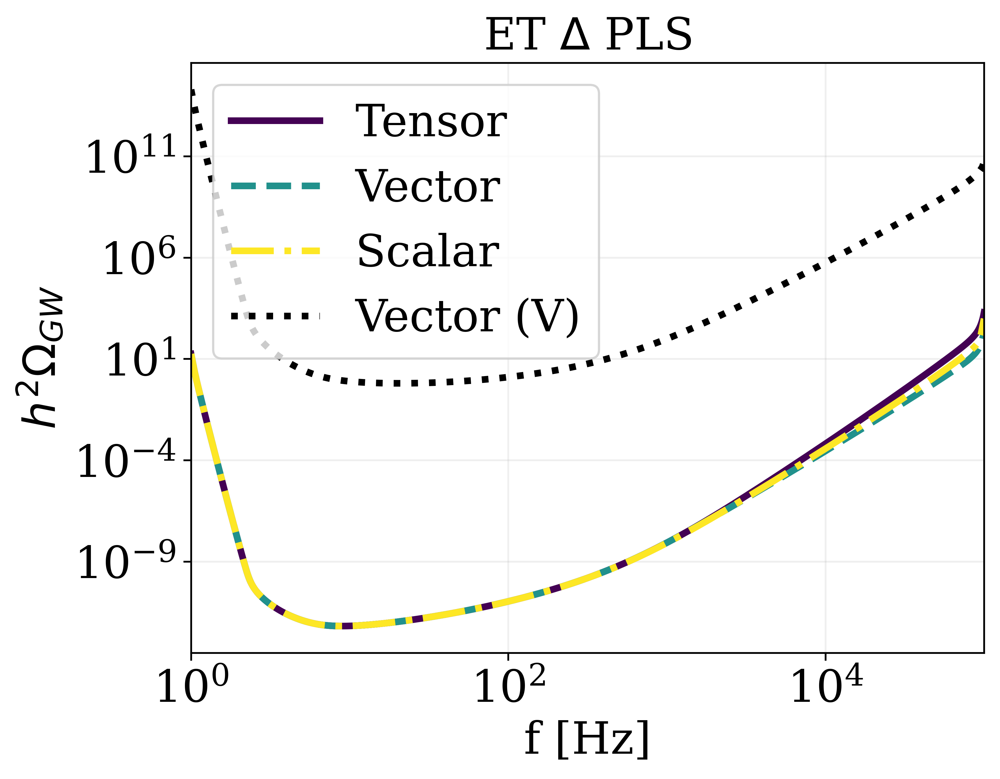

In [41]:
f = np.logspace(0, np.log10(100000), 1000)

fref = 25
snr = 1
Tobs = 1

pls_t = pls.PLS('ET X', 'ET Y', f, fref, 't', snr, Tobs, 0, None)
pls_v = pls.PLS('ET X', 'ET Y', f, fref, 'v', snr, Tobs, 0, None)
pls_s = pls.PLS('ET X', 'ET Y', f, fref, 's', snr, Tobs, 0, None)
pls_V = pls.PLS('ET X', 'ET Y', f, fref, 'V', snr, Tobs, 0, None)

colors = plt.cm.viridis(np.linspace(0, 1, 3))

plt.plot(f, pls_t, label='Tensor', color=colors[0], rasterized=True)
plt.plot(f, pls_v, label='Vector', color=colors[1], linestyle='--', rasterized=True)
plt.plot(f, pls_s, label='Scalar', color=colors[2], linestyle='-.', rasterized=True)
plt.plot(f, pls_V, label='Vector (V)', color='k', linestyle=':', rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}$')
plt.title(r'ET $\Delta$ PLS')
plt.grid(alpha=0.2, which='both')
plt.xlim(1, 1e5)
plt.legend()

In [42]:
print(np.min(pls_t))
print(np.min(pls_v))
print(np.min(pls_s))

6.538941902782183e-13
6.538298144816106e-13
6.539219078214258e-13


* Angular Response

In [43]:
f = np.logspace(0, np.log10(100000), 1000)

print('Calculating Angular response for the monopole...')   
print('- tensor modes')
R0_t = AngularResponse.R_ell(0, 'ET X', 'ET Y', f, 't', 0, shift_angle=None)
print('- vector modes')
R0_v = AngularResponse.R_ell(0, 'ET X', 'ET Y', f, 'v', 0, shift_angle=None)
print('- scalar modes')
R0_s = AngularResponse.R_ell(0, 'ET X', 'ET Y', f, 's', 0, shift_angle=None)
print('- V')
R0_V = AngularResponse.R_ell(0, 'ET X', 'ET Y', f, 'V', 0, shift_angle=None)

print('Calculating Angular response for the dipole...')   
print('- tensor modes')
R1_t = AngularResponse.R_ell(1, 'ET X', 'ET Y', f, 't', 0, shift_angle=None)
print('- vector modes')
R1_v = AngularResponse.R_ell(1, 'ET X', 'ET Y', f, 'v', 0, shift_angle=None)
print('- scalar modes')
R1_s = AngularResponse.R_ell(1, 'ET X', 'ET Y', f, 's', 0, shift_angle=None)
print('- V')
R1_V = AngularResponse.R_ell(1, 'ET X', 'ET Y', f, 'V', 0, shift_angle=None)

print('Calculating Angular response for the quadrupole...')   
print('- tensor modes')
R2_t = AngularResponse.R_ell(2, 'ET X', 'ET Y', f, 't', 0, shift_angle=None)
print('- vector modes')
R2_v = AngularResponse.R_ell(2, 'ET X', 'ET Y', f, 'v', 0, shift_angle=None)
print('- scalar modes')
R2_s = AngularResponse.R_ell(2, 'ET X', 'ET Y', f, 's', 0, shift_angle=None)
print('- V')
R2_V = AngularResponse.R_ell(2, 'ET X', 'ET Y', f, 'V', 0, shift_angle=None)

print('Calculating Angular response for the octupole...')   
print('- tensor modes')
R3_t = AngularResponse.R_ell(3, 'ET X', 'ET Y', f, 't', 0, shift_angle=None)
print('- vector modes')
R3_v = AngularResponse.R_ell(3, 'ET X', 'ET Y', f, 'v', 0, shift_angle=None)
print('- scalar modes')
R3_s = AngularResponse.R_ell(3, 'ET X', 'ET Y', f, 's', 0, shift_angle=None)
print('- V')
R3_V = AngularResponse.R_ell(3, 'ET X', 'ET Y', f, 'V', 0, shift_angle=None)


Calculating Angular response for the monopole...
- tensor modes
- vector modes
- scalar modes
- V
Calculating Angular response for the dipole...
- tensor modes
- vector modes
- scalar modes
- V
Calculating Angular response for the quadrupole...
- tensor modes
- vector modes
- scalar modes
- V
Calculating Angular response for the octupole...
- tensor modes
- vector modes
- scalar modes
- V


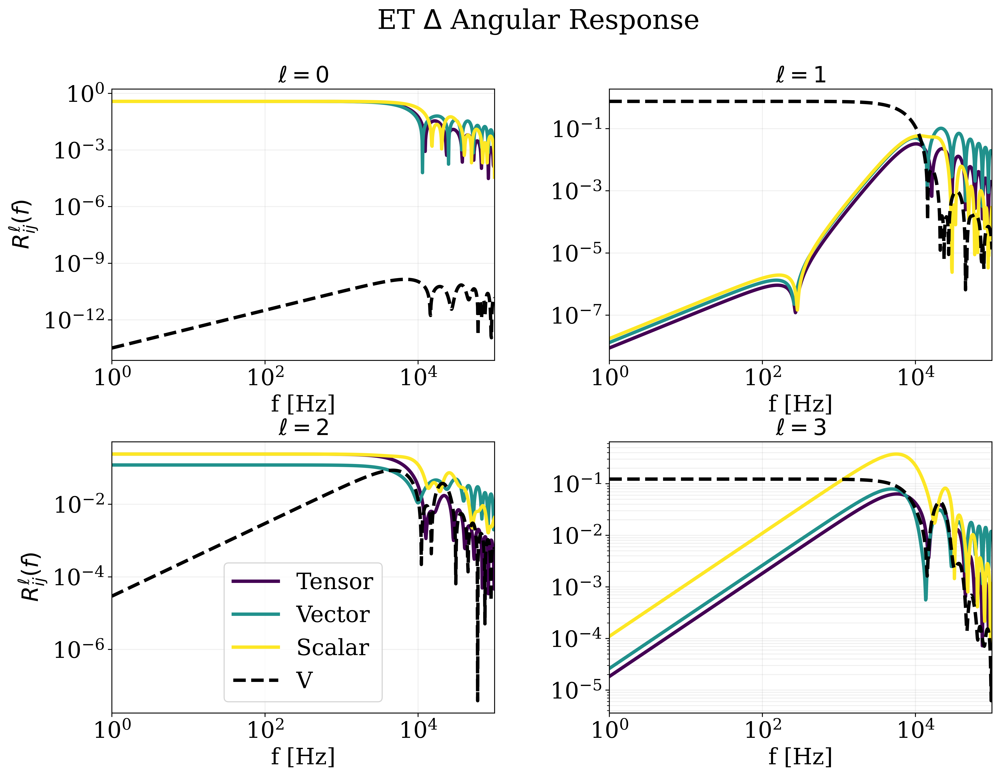

In [44]:
fig, axs = plt.subplots(2, 2, figsize=(14, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.3})


# monopole
axs[0, 0].plot(f, R0_t, label='Tensor', color=colors[0], rasterized=True)
axs[0, 0].plot(f, R0_v, label='Vector', color=colors[1], rasterized=True)
axs[0, 0].plot(f, R0_s, label='Scalar', color=colors[2], rasterized=True)
axs[0, 0].plot(f, R0_V, label='V', color='k', linestyle='--', rasterized=True)
axs[0, 0].set_xscale('log')
axs[0, 0].set_yscale('log')
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{ij}^{\ell}(f)$')
#axs[0, 0].legend()
axs[0, 0].grid(alpha=0.2, which='both')
axs[0, 0].set_xlim(1, 1e5)
axs[0, 0].set_title(r'$\ell = 0$')

# dipole
axs[0, 1].plot(f, R1_t, label='Tensor', color=colors[0], rasterized=True)
axs[0, 1].plot(f, R1_v, label='Vector', color=colors[1], rasterized=True)
axs[0, 1].plot(f, R1_s, label='Scalar', color=colors[2], rasterized=True)
axs[0, 1].plot(f, R1_V, label='V', color='k', linestyle='--', rasterized=True)
axs[0, 1].set_xscale('log')
axs[0, 1].set_yscale('log')
axs[0, 1].set_xlabel('f [Hz]')
#axs[0, 1].legend()
axs[0, 1].grid(alpha=0.2, which='both')
axs[0, 1].set_xlim(1, 1e5)
axs[0, 1].set_title(r'$\ell = 1$')

# quadrupole
axs[1, 0].plot(f, R2_t, label='Tensor', color=colors[0], rasterized=True)
axs[1, 0].plot(f, R2_v, label='Vector', color=colors[1], rasterized=True)
axs[1, 0].plot(f, R2_s, label='Scalar', color=colors[2], rasterized=True)
axs[1, 0].plot(f, R2_V, label='V', color='k', linestyle='--', rasterized=True)
axs[1, 0].set_xscale('log')
axs[1, 0].set_yscale('log')
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{ij}^{\ell}(f)$')
axs[1, 0].legend()
axs[1, 0].grid(alpha=0.2, which='both')
axs[1, 0].set_xlim(1, 1e5)
axs[1, 0].set_title(r'$\ell = 2$')

# octupole
axs[1, 1].plot(f, R3_t, label='Tensor', color=colors[0], rasterized=True)
axs[1, 1].plot(f, R3_v, label='Vector', color=colors[1], rasterized=True)
axs[1, 1].plot(f, R3_s, label='Scalar', color=colors[2], rasterized=True)
axs[1, 1].plot(f, R3_V, label='V', color='k', linestyle='--', rasterized=True)
axs[1, 1].set_xscale('log')
axs[1, 1].set_yscale('log')
axs[1, 1].set_xlabel('f [Hz]')
#axs[1, 1].legend()
axs[1, 1].grid(alpha=0.2, which='both')
axs[1, 1].set_xlim(1, 1e5)
axs[1, 1].set_title(r'$\ell = 3$')

# Imposta il titolo principale
fig.suptitle(r'ET $\Delta$ Angular Response')

plt.show()

* Sensitivity curver for the multipoles


In [45]:
pls0_t = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 0, f, 't', 0, fref, snr, Tobs, 1)
pls1_t = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 1, f, 't', 0, fref, snr, Tobs,  1e-3)
pls2_t = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 2, f, 't', 0, fref, snr, Tobs,  1e-3)
pls3_t = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 3, f, 't', 0, fref, snr, Tobs,  1e-3)


print(np.min(pls0_t))
print(np.min(pls1_t))
print(np.min(pls2_t))
print(np.min(pls3_t))

6.538941902782182e-13
7.375265130481536e-05
3.23641042178095e-11
3.454086605523114e-08


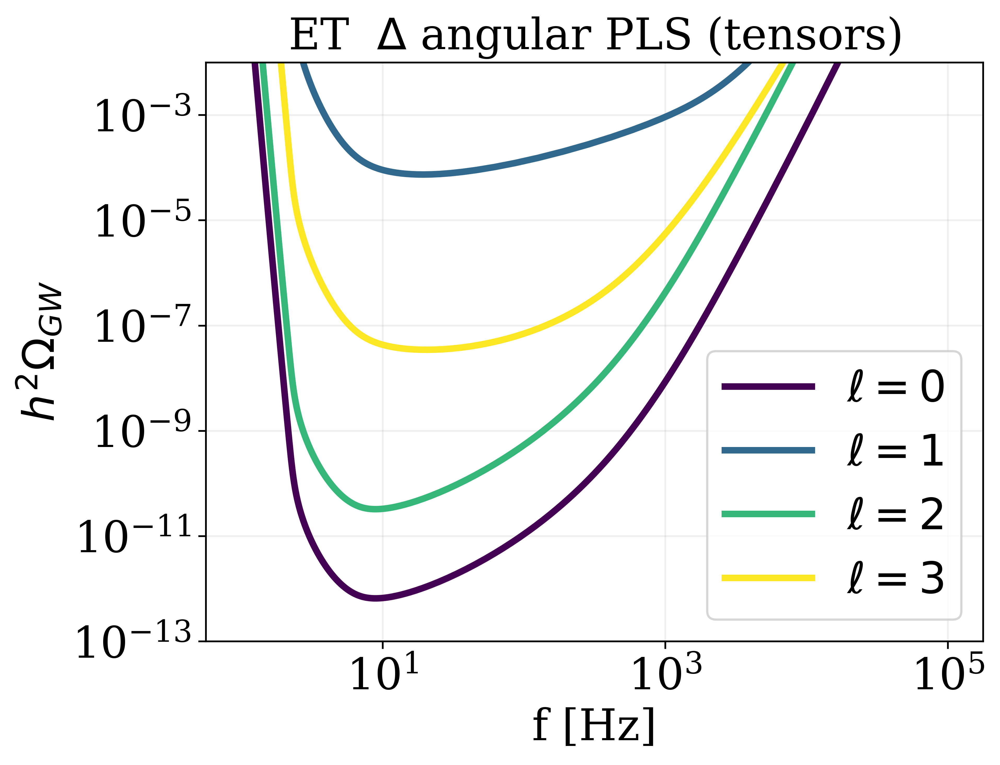

In [46]:
colors = plt.cm.viridis(np.linspace(0, 1, 4))
plt.plot(f, pls0_t, label=r'$\ell=0$', color=colors[0], rasterized=True)
plt.plot(f, pls1_t, label=r'$\ell=1$', color=colors[1], rasterized=True)
plt.plot(f, pls2_t, label=r'$\ell=2$', color=colors[2], rasterized=True)
plt.plot(f, pls3_t, label=r'$\ell=3$', color=colors[3], rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}$')
plt.title(r'ET  $\Delta$ angular PLS (tensors)')
plt.ylim(1e-13, 1e-2)
plt.grid(alpha=0.2, which='both')
plt.legend()

In [47]:
# vector modes

pls0_v = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 0, f, 'v', 0, fref, snr, Tobs, 1)
pls1_v = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 1, f, 'v', 0, fref, snr, Tobs,  1e-3)
pls2_v = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 2, f, 'v', 0, fref, snr, Tobs,  1e-3)
pls3_v = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 3, f, 'v', 0,fref, snr, Tobs,  1e-3)


print(np.min(pls0_v))
print(np.min(pls1_v))
print(np.min(pls2_v))
print(np.min(pls3_v))

6.538298144816106e-13
4.9306376732164675e-05
6.47238977226776e-11
2.417332654324832e-08


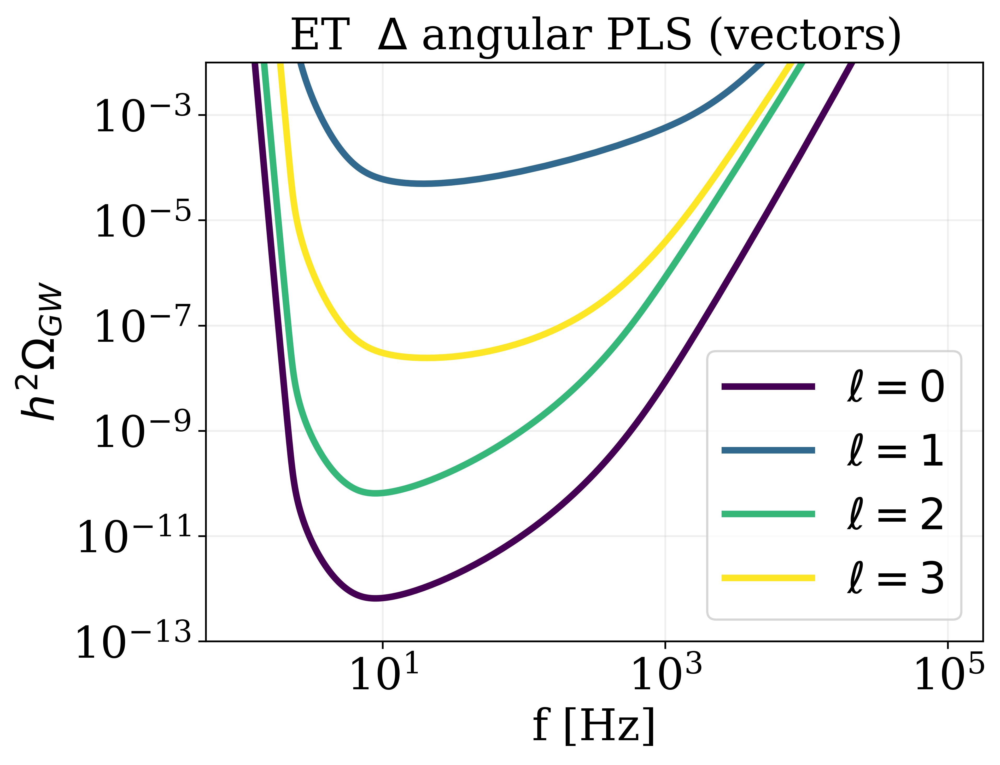

In [48]:
colors = plt.cm.viridis(np.linspace(0, 1, 4))
plt.plot(f, pls0_v, label=r'$\ell=0$', color=colors[0], rasterized=True)
plt.plot(f, pls1_v, label=r'$\ell=1$', color=colors[1], rasterized=True)
plt.plot(f, pls2_v, label=r'$\ell=2$', color=colors[2], rasterized=True)
plt.plot(f, pls3_v, label=r'$\ell=3$', color=colors[3], rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}$')
plt.title(r'ET  $\Delta$ angular PLS (vectors)')
plt.ylim(1e-13, 1e-2)
plt.grid(alpha=0.2, which='both')
plt.legend()

In [49]:
# scalar modes

pls0_s = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 0, f, 's', 0, fref, snr, Tobs, 1)
pls1_s = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 1, f, 's', 0, fref, snr, Tobs,  1e-3)
pls2_s = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 2, f, 's', 0, fref, snr, Tobs,  1e-3)
pls3_s = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 3, f, 's', 0, fref, snr, Tobs,  1e-3)

print(np.min(pls0_s))
print(np.min(pls1_s))
print(np.min(pls2_s))
print(np.min(pls3_s))

6.539219078214257e-13
3.6698697914927497e-05
3.236002371722236e-11
5.7568112175506534e-09


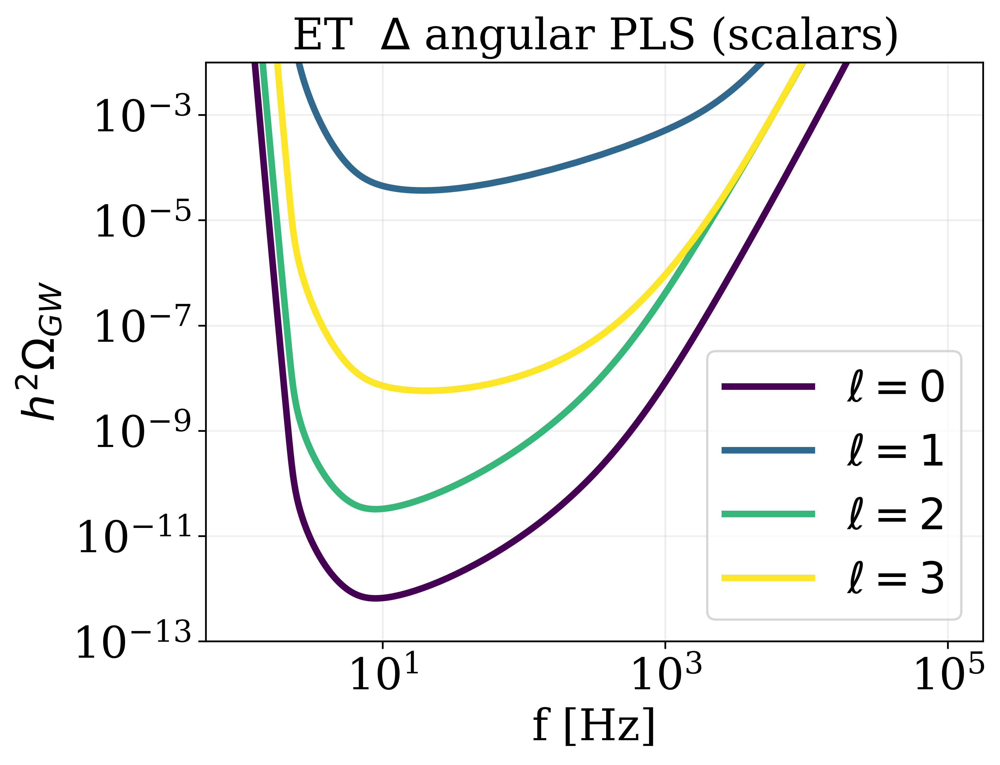

In [50]:
colors = plt.cm.viridis(np.linspace(0, 1, 4))
plt.plot(f, pls0_s, label=r'$\ell=0$', color=colors[0], rasterized=True)
plt.plot(f, pls1_s, label=r'$\ell=1$', color=colors[1], rasterized=True)
plt.plot(f, pls2_s, label=r'$\ell=2$', color=colors[2], rasterized=True)
plt.plot(f, pls3_s, label=r'$\ell=3$', color=colors[3], rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}$')
plt.title(r'ET  $\Delta$ angular PLS (scalars)')
plt.ylim(1e-13, 1e-2)
plt.grid(alpha=0.2, which='both')
plt.legend()

In [51]:
pls0_V = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 0, f, 'V', 0, fref, snr, Tobs, 1)
pls1_V = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 1, f, 'V', 0, fref, snr, Tobs,  1e-3)
pls2_V = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 2, f, 'V', 0, fref, snr, Tobs,  1e-3)
pls3_V = Sensitivity_ell.PLS_ell('ET X', 'ET Y', 3, f, 'V', 0, fref, snr, Tobs,  1e-3)


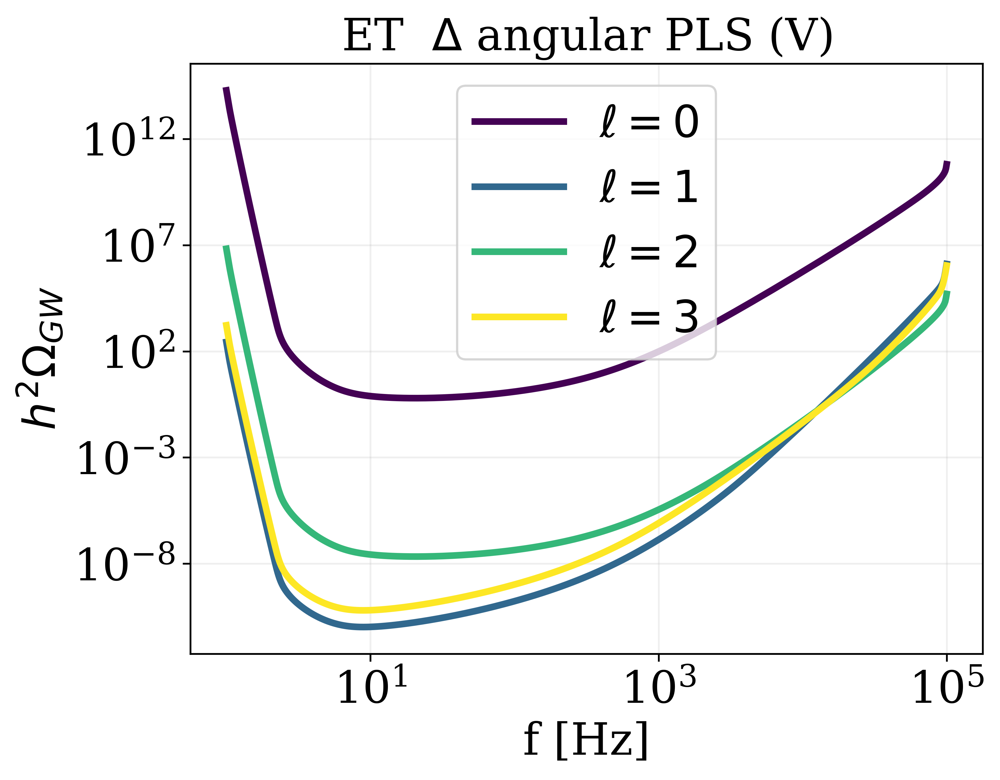

In [52]:
colors = plt.cm.viridis(np.linspace(0, 1, 4))
plt.plot(f, pls0_V, label=r'$\ell=0$', color=colors[0], rasterized=True)
plt.plot(f, pls1_V, label=r'$\ell=1$', color=colors[1], rasterized=True)
plt.plot(f, pls2_V, label=r'$\ell=2$', color=colors[2], rasterized=True)
plt.plot(f, pls3_V, label=r'$\ell=3$', color=colors[3], rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}$')
plt.title(r'ET  $\Delta$ angular PLS (V)')
#plt.ylim(1e-13, 1e-2)
plt.grid(alpha=0.2, which='both')
plt.legend()

* ET $\Delta$ + CE sensitivity to X polarization modes

In [53]:
f = np.logspace(np.log10(3), np.log10(3000), 1000)

fref = 25
snr = 1
Tobs = 1

pls_tv_etCE = pls.PLS_2pol('ET X', 'ET Y', 'CE', f, fref, 'v', snr, Tobs, 0, None)
pls_ts_etCE = pls.PLS_2pol('ET X', 'ET Y', 'CE', f, fref, 's', snr, Tobs, 0, None)

In [54]:
print(np.min(pls_tv_etCE))
print(np.min(pls_ts_etCE))

1.3531811814212992e-11
7.472341101879269e-12


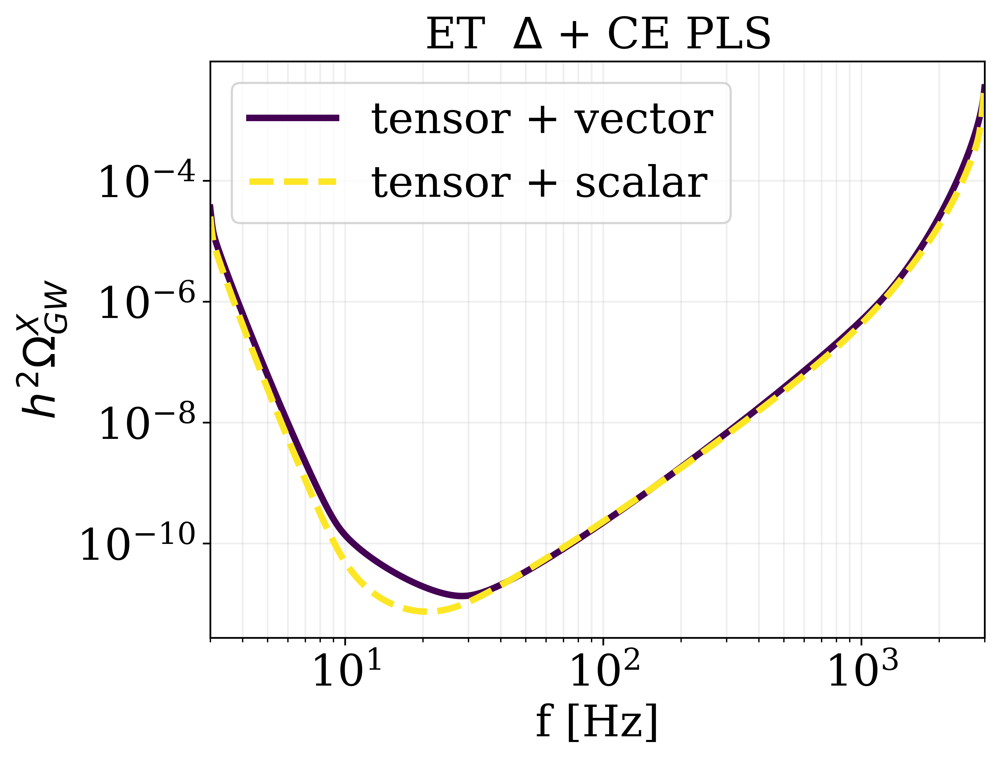

In [55]:
colors = plt.cm.viridis(np.linspace(0, 1, 2))
plt.plot(f, pls_tv_etCE, label='tensor + vector', color=colors[0], rasterized=True)
plt.plot(f, pls_ts_etCE, label='tensor + scalar', linestyle='--', color=colors[1], rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}^X$')
plt.xlim(3, 3e3)
plt.title(r'ET  $\Delta$ + CE PLS')
plt.grid(alpha=0.2, which='both')
plt.legend()

In [56]:
f = np.logspace(np.log10(3), np.log10(3000), 1000)

fref = 25
snr = 1
Tobs = 1

pls_t_etCE = pls.PLS_3pol('ET X', 'ET Y', 'CE', f, fref, 't', snr, Tobs, 0, None)
pls_v_etCE = pls.PLS_3pol('ET X', 'ET Y', 'CE', f, fref, 'v', snr, Tobs, 0, None)
pls_s_etCE = pls.PLS_3pol('ET X', 'ET Y', 'CE', f, fref, 's', snr, Tobs, 0, None)

In [57]:
# find minimum

min_PLS_t = np.min(pls_t_etCE)  
print('min PLS t', min_PLS_t)

min_PLS_v = np.min(pls_v_etCE)
print('min PLS v', min_PLS_v)

min_PLS_s = np.min(pls_s_etCE)
print('min PLS s', min_PLS_s)

min PLS t 5.899493588427225e-12
min PLS v 8.828307682483e-12
min PLS s 4.453466696558133e-12


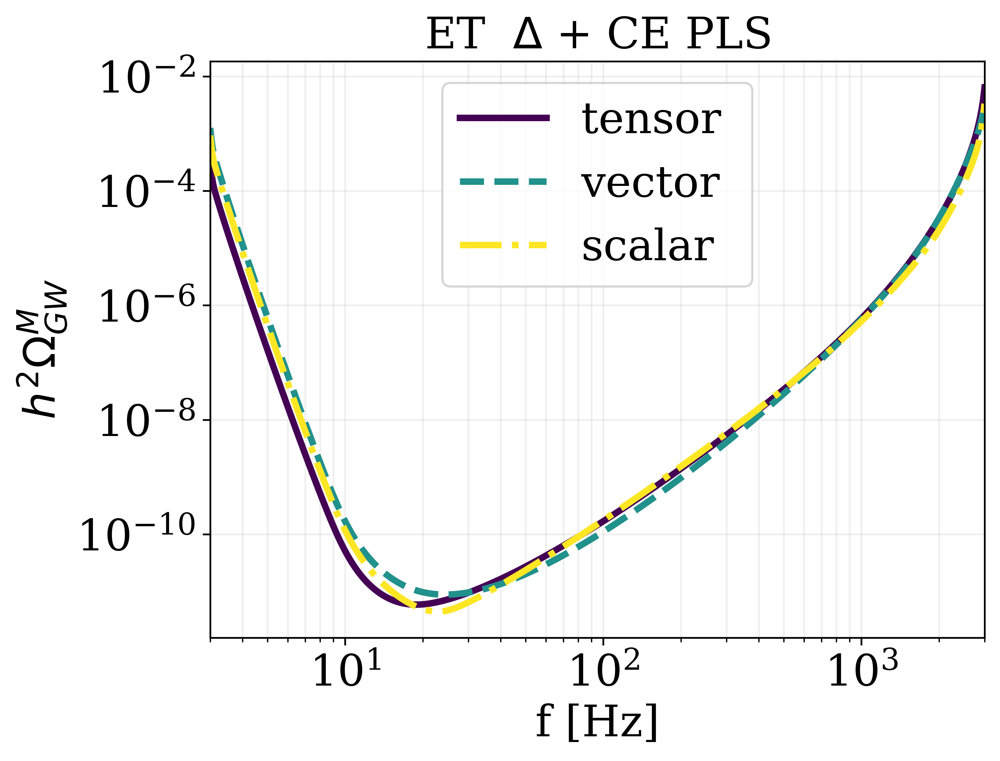

In [58]:
colors = plt.cm.viridis(np.linspace(0, 1, 3))
plt.plot(f, pls_t_etCE, label='tensor ', color=colors[0], rasterized=True)
plt.plot(f, pls_v_etCE, label='vector', linestyle='--', color=colors[1], rasterized=True)
plt.plot(f, pls_s_etCE, label='scalar', linestyle='-.', color=colors[2], rasterized=True)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f [Hz]')
plt.ylabel(r'$h^2\Omega_{GW}^M$')
plt.xlim(3, 3e3)
plt.title(r'ET  $\Delta$ + CE PLS')
plt.grid(alpha=0.2, which='both')
plt.legend()